Different ControlNet models and examples

In [1]:
#@title funcs
import os
_B=True
_A=False
def return__isValidDir(directory):
    if os.path.isdir(directory):return _B
    else:return _A

if not return__isValidDir('/content/drive/MyDrive'):
    from google.colab import drive
    drive.mount('/content/drive')

import zipfile
import numpy as np
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

def decompress_zip(zip_file, dest_folder, flatten=False):
    # Create the destination folder if it doesn't exist
    if not os.path.exists(dest_folder):
        os.makedirs(dest_folder)

    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        # Extract all files into the destination folder
        if flatten:
            for file_info in zip_ref.infolist():
                with zip_ref.open(file_info) as file, open(os.path.join(dest_folder, os.path.basename(file_info.filename)), 'wb') as output_file:
                    output_file.write(file.read())
        else:
            zip_ref.extractall(dest_folder)


def maxx(image_ref, max_width=256):
    # Calculate the new height while maintaining the aspect ratio
    aspect_ratio = image_ref.width / image_ref.height
    new_height = int(max_width / aspect_ratio)

    # Resize the image
    image_ref.thumbnail((max_width, new_height))

    return image_ref

palette = np.asarray([
    [0, 0, 0],
    [120, 120, 120],
    [180, 120, 120],
    [6, 230, 230],
    [80, 50, 50],
    [4, 200, 3],
    [120, 120, 80],
    [140, 140, 140],
    [204, 5, 255],
    [230, 230, 230],
    [4, 250, 7],
    [224, 5, 255],
    [235, 255, 7],
    [150, 5, 61],
    [120, 120, 70],
    [8, 255, 51],
    [255, 6, 82],
    [143, 255, 140],
    [204, 255, 4],
    [255, 51, 7],
    [204, 70, 3],
    [0, 102, 200],
    [61, 230, 250],
    [255, 6, 51],
    [11, 102, 255],
    [255, 7, 71],
    [255, 9, 224],
    [9, 7, 230],
    [220, 220, 220],
    [255, 9, 92],
    [112, 9, 255],
    [8, 255, 214],
    [7, 255, 224],
    [255, 184, 6],
    [10, 255, 71],
    [255, 41, 10],
    [7, 255, 255],
    [224, 255, 8],
    [102, 8, 255],
    [255, 61, 6],
    [255, 194, 7],
    [255, 122, 8],
    [0, 255, 20],
    [255, 8, 41],
    [255, 5, 153],
    [6, 51, 255],
    [235, 12, 255],
    [160, 150, 20],
    [0, 163, 255],
    [140, 140, 140],
    [250, 10, 15],
    [20, 255, 0],
    [31, 255, 0],
    [255, 31, 0],
    [255, 224, 0],
    [153, 255, 0],
    [0, 0, 255],
    [255, 71, 0],
    [0, 235, 255],
    [0, 173, 255],
    [31, 0, 255],
    [11, 200, 200],
    [255, 82, 0],
    [0, 255, 245],
    [0, 61, 255],
    [0, 255, 112],
    [0, 255, 133],
    [255, 0, 0],
    [255, 163, 0],
    [255, 102, 0],
    [194, 255, 0],
    [0, 143, 255],
    [51, 255, 0],
    [0, 82, 255],
    [0, 255, 41],
    [0, 255, 173],
    [10, 0, 255],
    [173, 255, 0],
    [0, 255, 153],
    [255, 92, 0],
    [255, 0, 255],
    [255, 0, 245],
    [255, 0, 102],
    [255, 173, 0],
    [255, 0, 20],
    [255, 184, 184],
    [0, 31, 255],
    [0, 255, 61],
    [0, 71, 255],
    [255, 0, 204],
    [0, 255, 194],
    [0, 255, 82],
    [0, 10, 255],
    [0, 112, 255],
    [51, 0, 255],
    [0, 194, 255],
    [0, 122, 255],
    [0, 255, 163],
    [255, 153, 0],
    [0, 255, 10],
    [255, 112, 0],
    [143, 255, 0],
    [82, 0, 255],
    [163, 255, 0],
    [255, 235, 0],
    [8, 184, 170],
    [133, 0, 255],
    [0, 255, 92],
    [184, 0, 255],
    [255, 0, 31],
    [0, 184, 255],
    [0, 214, 255],
    [255, 0, 112],
    [92, 255, 0],
    [0, 224, 255],
    [112, 224, 255],
    [70, 184, 160],
    [163, 0, 255],
    [153, 0, 255],
    [71, 255, 0],
    [255, 0, 163],
    [255, 204, 0],
    [255, 0, 143],
    [0, 255, 235],
    [133, 255, 0],
    [255, 0, 235],
    [245, 0, 255],
    [255, 0, 122],
    [255, 245, 0],
    [10, 190, 212],
    [214, 255, 0],
    [0, 204, 255],
    [20, 0, 255],
    [255, 255, 0],
    [0, 153, 255],
    [0, 41, 255],
    [0, 255, 204],
    [41, 0, 255],
    [41, 255, 0],
    [173, 0, 255],
    [0, 245, 255],
    [71, 0, 255],
    [122, 0, 255],
    [0, 255, 184],
    [0, 92, 255],
    [184, 255, 0],
    [0, 133, 255],
    [255, 214, 0],
    [25, 194, 194],
    [102, 255, 0],
    [92, 0, 255],
])

Mounted at /content/drive


In [10]:
#@title select model
model_name = "Deliberate" # @param ["v1.5","Deliberate","dreamshaper-8","ProteusV0.2","uber-realistic-merge","URPM13_Diffusers","realdosmix_diffusers"]

if model_name == "Deliberate":
    cache_dir="/content/drive/MyDrive/models/SD/Deliberate"
    model_dir="Yntec/Deliberate"
    ign_patterns=["*.safetensors", "*.ckpt"]
    ign_patterns=["*.png", "*.ckpt"]
elif model_name == "dreamshaper-8":
    cache_dir="/content/drive/MyDrive/models/SD/dreamshaper8"
    model_dir="Lykon/dreamshaper-8"
    ign_patterns=["*.png", "*.ckpt"]
elif model_name == "ProteusV0.2":
    cache_dir="/content/drive/MyDrive/models/SD/ProteusV02"
    model_dir="dataautogpt3/ProteusV0.2"
    ign_patterns=["*.safetensors", "*.ckpt"]
elif model_name == "uber-realistic-merge":
    cache_dir="/content/drive/MyDrive/models/SD/uberrealisticmerge"
    model_dir="stablediffusionapi/uber-realistic-merge"
    ign_patterns=["*.safetensors", "*.ckpt"]
elif model_name == "realdosmix_diffusers":
    cache_dir="/content/drive/MyDrive/models/SD/realdosmix_diffusers"
    model_dir="digiplay/realdosmix_diffusers"
    ign_patterns=["*.safetensors", "*.ckpt"]
elif model_name == "URPM13_Diffusers":
    cache_dir="/content/drive/MyDrive/models/SD/URPM13_Diffusers"
    model_dir="Jeroenvv1985/URPM13_Diffusers"
    ign_patterns=["*.safetensors", "*.ckpt"]
else:
    cache_dir="/content/drive/MyDrive/models/SD/sd1.5"
    model_dir="runwayml/stable-diffusion-v1-5"
    ign_patterns=["*.safetensors", "*.ckpt"]

import os
from google.colab import userdata
HF_TOKEN = userdata.get('HF_TOKEN')
!huggingface-cli login --token {HF_TOKEN}

if not os.path.exists(cache_dir):
    os.makedirs(cache_dir)
    from huggingface_hub import snapshot_download
    path = snapshot_download(repo_id=f"{model_dir}", repo_type="model", revision="main", local_dir=f"{cache_dir}", ignore_patterns=ign_patterns, local_dir_use_symlinks=False)
    clear_output(); print("Model downloaded.");


cn_cache_dir="/content/drive/MyDrive/models/SD/lllyasviel/sd-controlnet-depth"
cn_model_dir="lllyasviel/sd-controlnet-depth"
cn_ign_patterns=["*.ckpt"]

if not os.path.exists(cn_cache_dir):
    os.makedirs(cn_cache_dir)
    from huggingface_hub import snapshot_download
    path = snapshot_download(repo_id=f"{cn_model_dir}", repo_type="model", revision="main", local_dir=f"{cn_cache_dir}", ignore_patterns=cn_ign_patterns, local_dir_use_symlinks=False)
    clear_output(); print("Model downloaded.");

In [ ]:
#@title Quickinstall
!pip install -q git+https://github.com/huggingface/accelerate.git
#!pip install -q diffusers
!pip install git+https://github.com/huggingface/diffusers

#!pip install xformers==0.0.22.post4 --index-url https://download.pytorch.org/whl/cu118
# Colab CUDA Version: 12.2 🔥 Torch Version: 2.1.0+cu12
!wget --content-disposition https://t.co/9WZvWVGYqR -P /content
!pip install xformers-0.0.22.post7-cp310-cp310-manylinux2014_x86_64.whl

from IPython.display import display, clear_output
!pip install pytorch_lightning numpy
!pip install -q opencv-contrib-python
!pip install -q controlnet_aux
!pip install mediapipe
clear_output()
print(f"Done")

# install v2
def install_v2():
    import locale
    locale.getpreferredencoding = lambda: "UTF-8"
    !pip install -q https://download.pytorch.org/whl/cu118/torch-2.1.0%2Bcu118-cp310-cp310-linux_x86_64.whl
    !pip install -q https://download.pytorch.org/whl/triton-2.1.0-0-cp310-cp310-manylinux2014_x86_64.manylinux_2_17_x86_64.whl
    !pip install -q https://download.pytorch.org/whl/cu118/xformers-0.0.22.post4%2Bcu118-cp310-cp310-manylinux2014_x86_64.whl
    !pip install -q diffusers transformers accelerate
    !pip install -q https://github.com/chengzeyi/stable-fast/releases/download/v0.0.15/stable_fast-0.0.15+torch210cu118-cp310-cp310-manylinux2014_x86_64.whl


In [7]:
import torch
print(f"Torch version: {torch.__version__}")
from transformers import __version__
print(f"Transformers version: {__version__}")
import xformers
print(f"Xformers version: {xformers.__version__}")
import torchaudio
print(f"Torchaudio version: {torchaudio.__version__}")
import torch
print(f"Cuda version: {torch.version.cuda}")

Torch version: 2.1.0+cu121
Transformers version: 4.35.2
Xformers version: 0.0.22.post7
Torchaudio version: 2.1.0+cu121
Cuda version: 12.1


## inference

In [4]:
#decompress_zip('/content/drive/MyDrive/depth_frames/video1_frames.zip','/content/frames')
decompress_zip('/content/drive/MyDrive/depth_frames/video1_frames_depth.zip','/content/depth')

In [ ]:
#@title load images
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image

image = load_image(
    "https://drive.usercontent.google.com/u/0/uc?id=101f_r2TdeZvW8UYGfxsB1oPKALll5tNP&export=download"
)
maxx(image)

# * * * *

#print("Object attributes:", dir(image))

from PIL import Image

# Specify the file path of the image
image_path = '/content/drive/MyDrive/data/blip2/11.jpg'  # Replace with the actual path to your image file

# Load the image
image = Image.open(image_path)
maxx(image)

### Create 4 superheroes

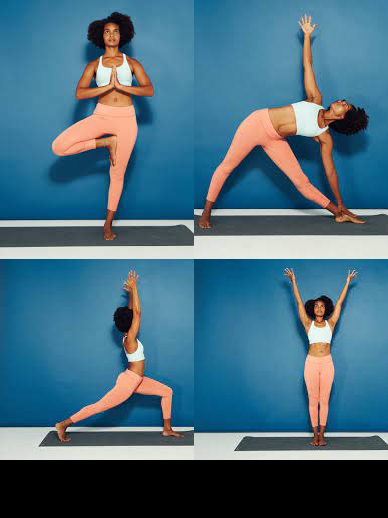

In [29]:
from diffusers.utils import load_image
urls = "yoga1.jpeg", "yoga2.jpeg", "yoga3.jpeg", "yoga4.jpeg"
imgs = [
    load_image("https://hf.co/datasets/YiYiXu/controlnet-testing/resolve/main/" + url)
    for url in urls
]
image_grid(imgs, 2, 2)

/usr/local/lib/python3.10/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_11m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_11m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_21m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_21m_224. This 

body_pose_model.pth:   0%|          | 0.00/209M [00:00<?, ?B/s]

hand_pose_model.pth:   0%|          | 0.00/147M [00:00<?, ?B/s]

facenet.pth:   0%|          | 0.00/154M [00:00<?, ?B/s]

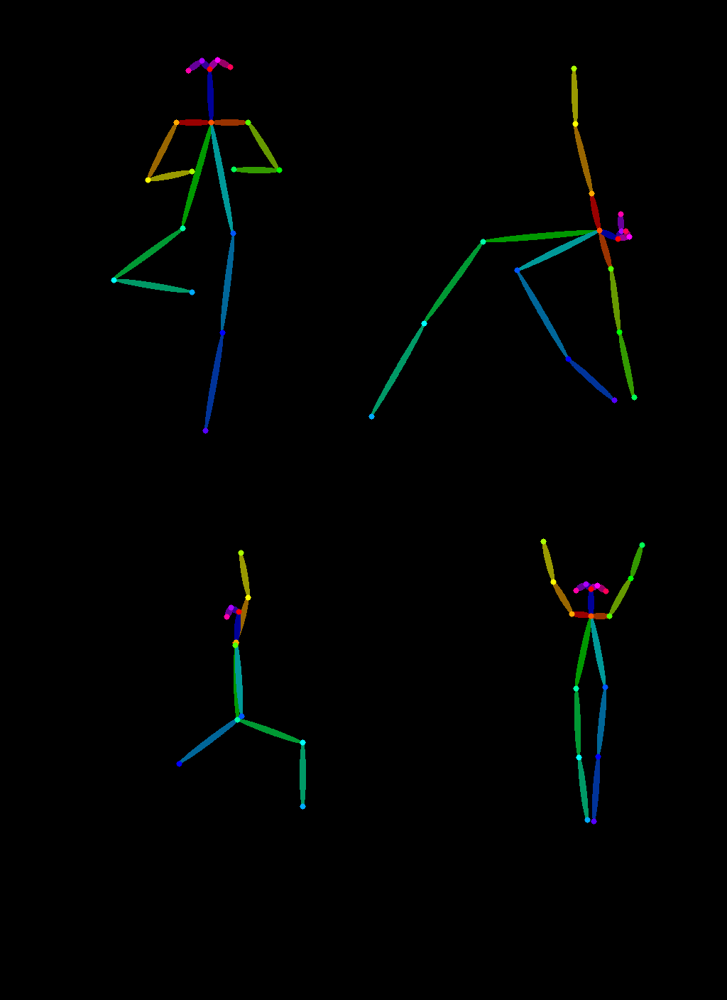

In [30]:
from controlnet_aux import OpenposeDetector
model = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
poses = [model(img) for img in imgs]
image_grid(poses, 2, 2)

In [31]:
controlnet = ControlNetModel.from_pretrained(
    "fusing/stable-diffusion-v1-5-controlnet-openpose", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    model_dir,
    cache_dir=f"cache_dir",
    controlnet=controlnet,
    torch_dtype=torch.float16,
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()
pipe.enable_xformers_memory_efficient_attention()

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/544 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/520 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/133 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.74k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/606 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/30 [00:00<?, ?it/s]

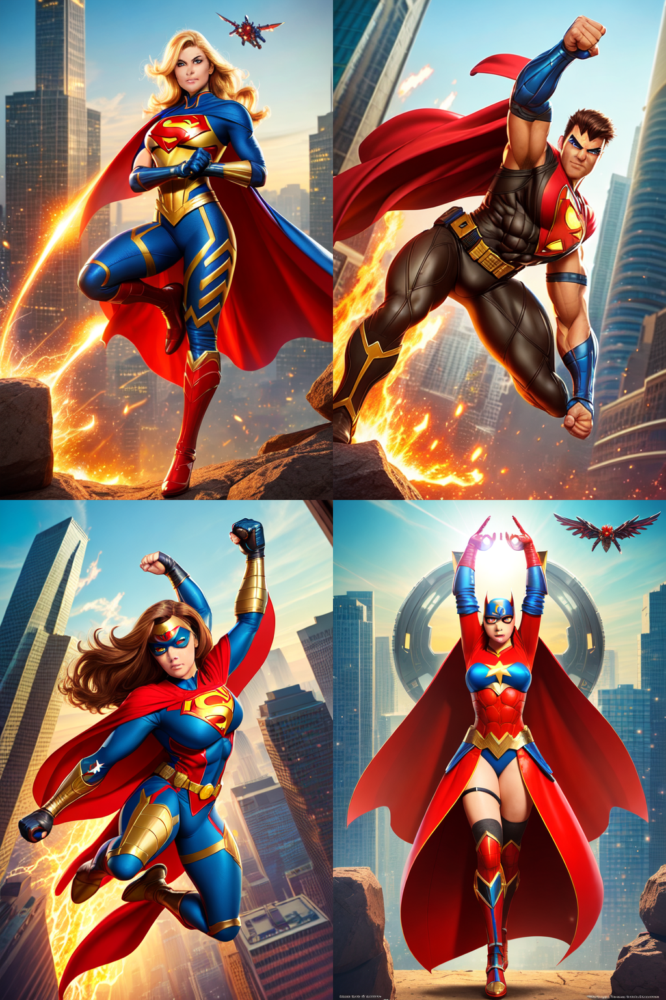

In [33]:
generator = [torch.Generator(device="cpu").manual_seed(999111999) for i in range(4)]
prompt = "super-hero character, best quality, extremely detailed"
output = pipe(
    [prompt] * 4,
    poses,
    negative_prompt=["monochrome, lowres, bad anatomy, worst quality, low quality"] * 4,
    generator=generator, num_inference_steps=30, height=768, width=512, guidance_scale=8
)
image_grid(output.images, 2, 2)

### depth test x4

In [11]:
from transformers import pipeline
def load_depthmap(image_filepath):
    depth_estimator = pipeline('depth-estimation')
    image = Image.open(image_filepath)
    image = depth_estimator(image)['depth']
    image = np.array(image)
    image = image[:, :, None]
    image = np.concatenate([image, image, image], axis=2)
    image = Image.fromarray(image)
    return image

#image = pipe("Batman", image, num_inference_steps=20).images[0]

Token indices sequence length is longer than the specified maximum sequence length for this model (78 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['<|endoftext|>', '<|endoftext|>', 'nose', '<|endoftext|>']


  0%|          | 0/30 [00:00<?, ?it/s]

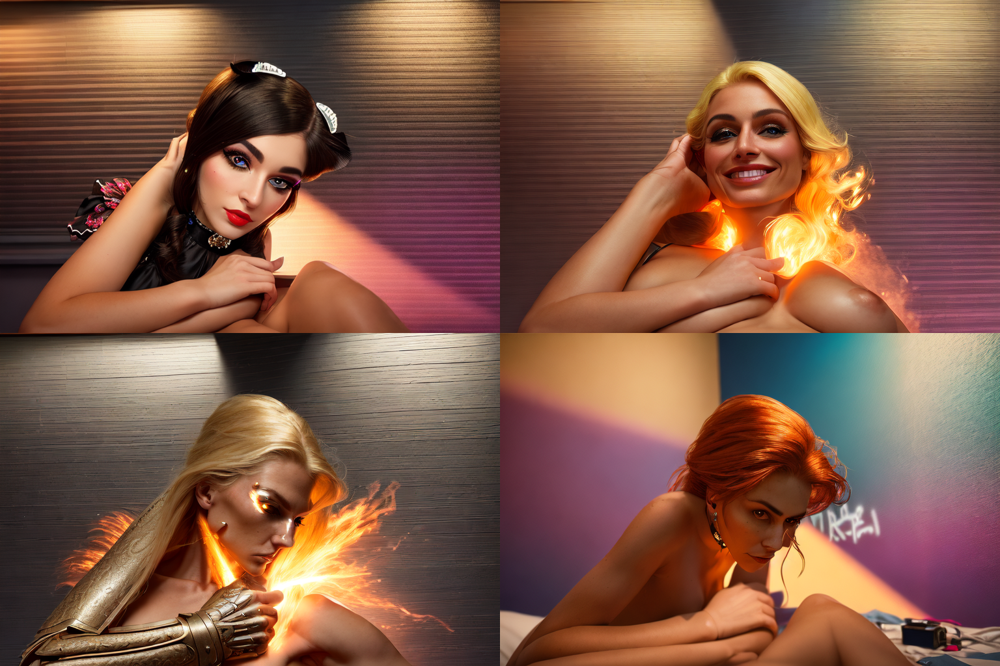

In [27]:
from diffusers import UniPCMultistepScheduler
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
depth_image = load_depthmap('/content/depth/c01_0011.png')

controlnet = ControlNetModel.from_pretrained(f"{cn_model_dir}", cache_dir=f"{cn_cache_dir}", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(f"{model_dir}", cache_dir=f"{cache_dir}", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()

clear_output()

prompt = ""
prompt = [t + prompt for t in ["beautiful face, perfect illumination, beautiful detailed eyes,looking at viewer, stunningly beautiful woman, detailed hairstyle, egirl in gamergirl room, ((black ruffle skirt)), choker, cat ears",
    "pretty woman ,  blonde, factory, realistic, smile, 1girl, slim body, small hip, sexy pose, big breast, high detail, realistic, photo quality, high quality,  (photorealistic:1.4), science fiction",
    "30-year-old female, blond hair, high cheekbones, strong jawline, ((tall)), ((Perfect Body)), (shapely body), (long legs), grey irises, drooping eyelid, ((Savage Barbarian armor)), ((body measurement is 36-26-36)), correct anatomy, high nose bridge, celestial nose",
    "portrait, sitting on bed, naked, (8k, RAW photo, best quality, ultra high res, photorealistic, masterpiece, ultra-detailed, Unreal Engine), legs wide, camera low, camera close, absurdres, best quality,1girl, solo, streaked hair, choker, (graffiti:1.25)"]]
generator = [torch.Generator(device="cpu").manual_seed(999111999) for i in range(len(prompt))]

output = pipe(
    prompt, depth_image,
    negative_prompt=["cartoon, anime, sketches, (worst quality:2), (low quality:2), (normal quality:2), lowres, normal quality, ((monochrome)), ((grayscale)), bad anatomy, girl, loli, young"] * len(prompt),
    generator=generator, num_inference_steps=30, height=512, width=768, guidance_scale=7
)
image_grid(output.images, 2, 2)

Next, we will put the image through the canny pre-processor:

### canny

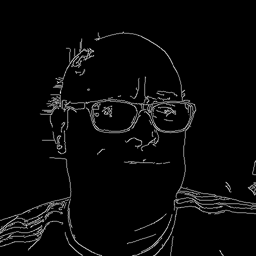

In [9]:
import cv2
from PIL import Image
import numpy as np

image = Image.open('/content/drive/MyDrive/data/steinhaug/512 - kim/kim (1).jpg')
image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
maxx(canny_image.copy())

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/20 [00:00<?, ?it/s]

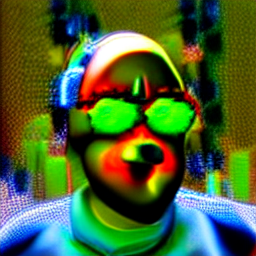

In [15]:
#from diffusers.pipelines.stable_diffusion import safety_checker
#def sc(self, clip_input, images) : return images, [False for i in images]
# edit the StableDiffusionSafetyChecker class so that, when called, it just returns the images and an array of True values
#safety_checker.StableDiffusionSafetyChecker.forward = sc

from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", cache_dir=f"{cache_dir}", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)

from diffusers import UniPCMultistepScheduler
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

#from diffusers import EulerDiscreteScheduler
#pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config)

pipe.enable_model_cpu_offload()

pipe.enable_xformers_memory_efficient_attention()

prompt = "a photo of sks mr potato head, best quality, extremely detailed"
generator = torch.manual_seed(1)
output = pipe(
    prompt,
    canny_image,
    negative_prompt="",
    generator=generator,
    num_inference_steps=20,
)
output.images[0]

### openpose

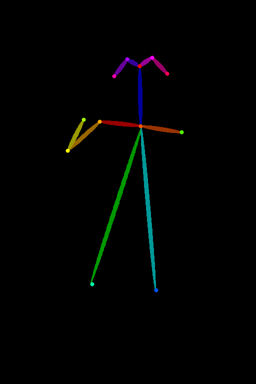

In [29]:
image_path = '/content/drive/MyDrive/data/blip2/17.jpg'
image = Image.open(image_path)

from controlnet_aux import OpenposeDetector

openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
openpose_image = openpose(image)
maxx(openpose_image.copy())

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/20 [00:00<?, ?it/s]

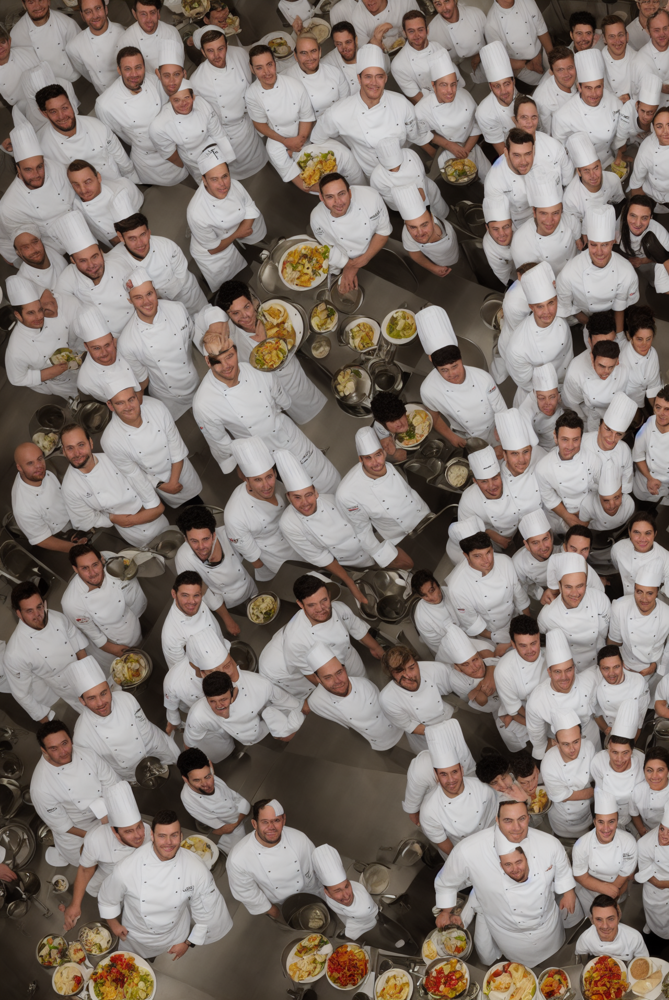

In [30]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()
image = pipe("chef in the kitchen", image, num_inference_steps=20).images[0]
#image.save('images/chef_pose_out.png')
image

### depth

No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


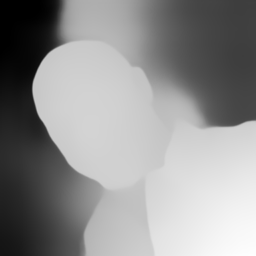

In [37]:
from transformers import pipeline

depth_estimator = pipeline('depth-estimation')

image = Image.open('/content/drive/MyDrive/data/steinhaug/512 - qkimrock/qkimbruce (1).jpg')

image = depth_estimator(image)['depth']
image = np.array(image)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
image = Image.fromarray(image)
maxx(image.copy())

In [ ]:
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-depth", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()
image = pipe("Batman", image, num_inference_steps=20).images[0]
image
#image.save('./images/stormtrooper_depth_out.png')

In [ ]:
def disabled_safety_checker(images, clip_input):
    if len(images.shape)==4:
        num_images = images.shape[0]
        return images, [False]*num_images
    else:
        return images, False

from diffusers import EulerDiscreteScheduler

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-depth", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)


pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config)
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()
#pipe.safety_checker = disabled_safety_checker

image = pipe("Superman bending over", image, num_inference_steps=20).images[0]
image

### seg

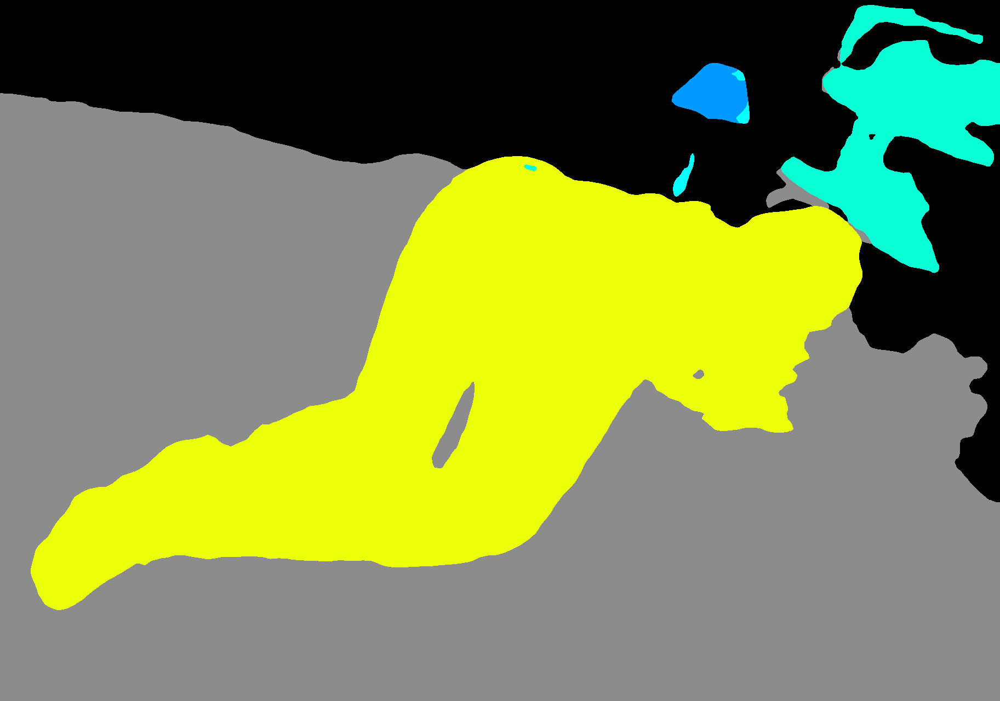

In [24]:
from transformers import AutoImageProcessor, UperNetForSemanticSegmentation

#openmmlab/upernet-convnext-large

image_processor = AutoImageProcessor.from_pretrained("openmmlab/upernet-convnext-small")
image_segmentor = UperNetForSemanticSegmentation.from_pretrained("openmmlab/upernet-convnext-small")

image = Image.open('/content/drive/MyDrive/data/blip2/11.jpg').convert('RGB')

pixel_values = image_processor(image, return_tensors="pt").pixel_values

with torch.no_grad():
  outputs = image_segmentor(pixel_values)

seg = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]

color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3

for label, color in enumerate(palette):
    color_seg[seg == label, :] = color

color_seg = color_seg.astype(np.uint8)

image = Image.fromarray(color_seg)
image

preprocessor_config.json:   0%|          | 0.00/372 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/8.76k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/940M [00:00<?, ?B/s]

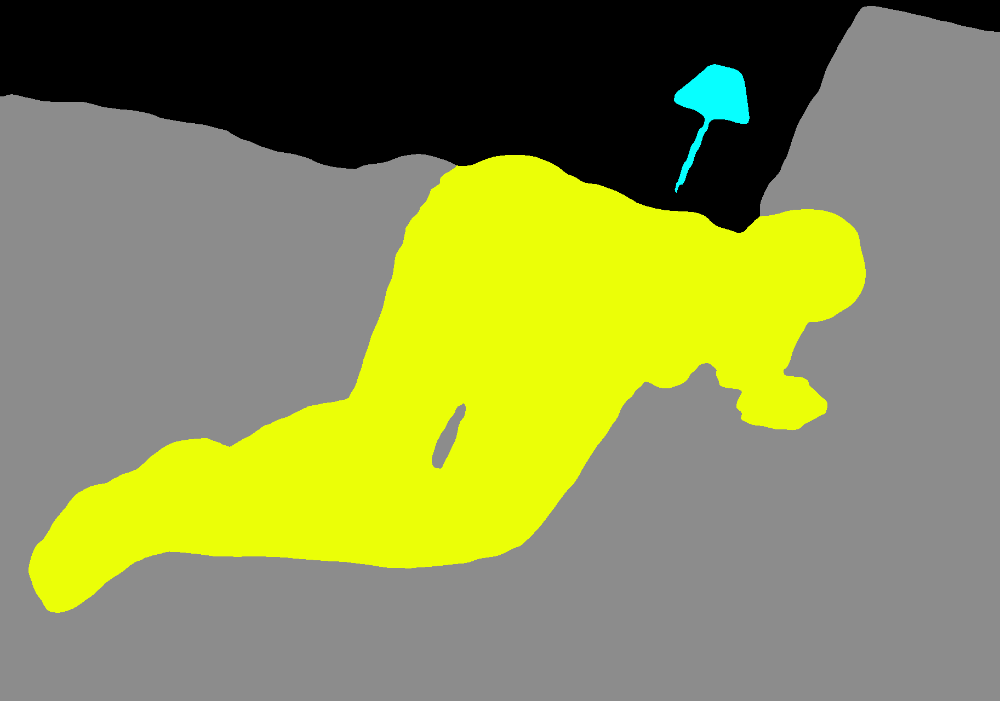

In [25]:
from transformers import AutoImageProcessor, UperNetForSemanticSegmentation

image_processor = AutoImageProcessor.from_pretrained("openmmlab/upernet-convnext-large")
image_segmentor = UperNetForSemanticSegmentation.from_pretrained("openmmlab/upernet-convnext-large")

image = Image.open('/content/drive/MyDrive/data/blip2/11.jpg').convert('RGB')

pixel_values = image_processor(image, return_tensors="pt").pixel_values

with torch.no_grad():
  outputs = image_segmentor(pixel_values)

seg = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]

color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3

for label, color in enumerate(palette):
    color_seg[seg == label, :] = color

color_seg = color_seg.astype(np.uint8)

image = Image.fromarray(color_seg)
image

In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-seg", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()

image = pipe("house", image, num_inference_steps=20).images[0]
image
#image.save('/content/seg.png')

### EXAMPLE Depth

No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/942 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.37G [00:00<?, ?B/s]

Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


preprocessor_config.json:   0%|          | 0.00/285 [00:00<?, ?B/s]

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/20 [00:00<?, ?it/s]

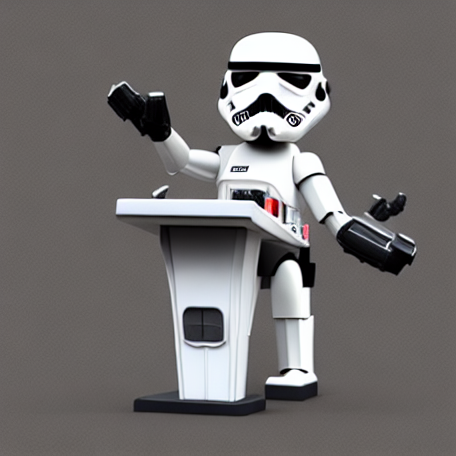

In [16]:
from transformers import pipeline
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from PIL import Image
import numpy as np
import torch
from diffusers.utils import load_image

depth_estimator = pipeline('depth-estimation')

image = load_image("https://huggingface.co/lllyasviel/sd-controlnet-depth/resolve/main/images/stormtrooper.png")

image = depth_estimator(image)['depth']
image = np.array(image)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
image = Image.fromarray(image)

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-depth", torch_dtype=torch.float16
)

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", cache_dir=f"{cache_dir}", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

# Remove if you do not have xformers installed
# see https://huggingface.co/docs/diffusers/v0.13.0/en/optimization/xformers#installing-xformers
# for installation instructions
pipe.enable_xformers_memory_efficient_attention()

pipe.enable_model_cpu_offload()

image = pipe("Stormtrooper's lecture", image, num_inference_steps=20).images[0]
image
#image.save('./images/stormtrooper_depth_out.png')

### EXAMPLE Canny

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/20 [00:00<?, ?it/s]

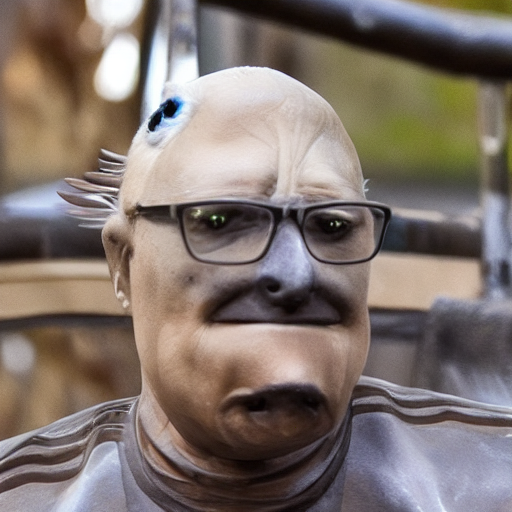

In [56]:
import cv2
from PIL import Image
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import torch
import numpy as np
from diffusers.utils import load_image

#image = load_image("https://huggingface.co/lllyasviel/sd-controlnet-canny/resolve/main/images/bird.png")
#image = np.array(image)

image = Image.open('/content/drive/MyDrive/data/steinhaug/512 - kim/kim (1).jpg')
image = np.array(image)

#image = load_image("https://drive.usercontent.google.com/u/0/uc?id=1QJWbWKGXQS9ie-FKXon-C7swXueCH5BW&export=download")
#image = np.array(image)



low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
image = Image.fromarray(image)

maxx(image.copy())

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16
)

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", cache_dir=f"{cache_dir}", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

# Remove if you do not have xformers installed
# see https://huggingface.co/docs/diffusers/v0.13.0/en/optimization/xformers#installing-xformers
# for installation instructions
pipe.enable_xformers_memory_efficient_attention()

pipe.enable_model_cpu_offload()

image = pipe("bird", image, num_inference_steps=20).images[0]
image
#image.save('images/bird_canny_out.png')


### EXAMPLE Openpose

In [ ]:
!pip install controlnet_aux

In [21]:
from PIL import Image
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import torch
from controlnet_aux import OpenposeDetector
from diffusers.utils import load_image

openpose = OpenposeDetector.from_pretrained('lllyasviel/ControlNet')

image = load_image("https://huggingface.co/lllyasviel/sd-controlnet-openpose/resolve/main/images/pose.png")

image = openpose(image)

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16
)

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", cache_dir=f"{cache_dir}", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

# Remove if you do not have xformers installed
# see https://huggingface.co/docs/diffusers/v0.13.0/en/optimization/xformers#installing-xformers
# for installation instructions
pipe.enable_xformers_memory_efficient_attention()

pipe.enable_model_cpu_offload()

image = pipe("chef in the kitchen", image, num_inference_steps=20).images[0]
image
#image.save('images/chef_pose_out.png')


RuntimeError: Detected that PyTorch and torchvision were compiled with different CUDA major versions. PyTorch has CUDA Version=11.8 and torchvision has CUDA Version=12.1. Please reinstall the torchvision that matches your PyTorch install.

### EXAMPLE Seg

preprocessor_config.json:   0%|          | 0.00/372 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/8.76k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/328M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/20 [00:00<?, ?it/s]

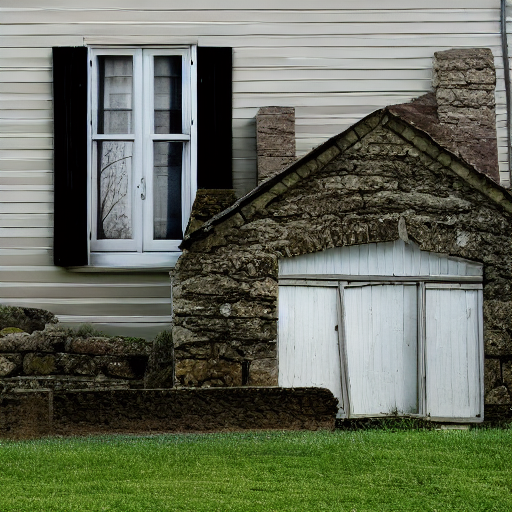

In [23]:
from transformers import AutoImageProcessor, UperNetForSemanticSegmentation
from PIL import Image
import numpy as np
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from diffusers.utils import load_image

image_processor = AutoImageProcessor.from_pretrained("openmmlab/upernet-convnext-small")
image_segmentor = UperNetForSemanticSegmentation.from_pretrained("openmmlab/upernet-convnext-small")

image = load_image("https://huggingface.co/lllyasviel/sd-controlnet-seg/resolve/main/images/house.png").convert('RGB')

pixel_values = image_processor(image, return_tensors="pt").pixel_values

with torch.no_grad():
  outputs = image_segmentor(pixel_values)

seg = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]

color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3

for label, color in enumerate(palette):
    color_seg[seg == label, :] = color

color_seg = color_seg.astype(np.uint8)

image = Image.fromarray(color_seg)

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-seg", torch_dtype=torch.float16
)

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", cache_dir=f"{cache_dir}", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

# Remove if you do not have xformers installed
# see https://huggingface.co/docs/diffusers/v0.13.0/en/optimization/xformers#installing-xformers
# for installation instructions
pipe.enable_xformers_memory_efficient_attention()

pipe.enable_model_cpu_offload()

image = pipe("house", image, num_inference_steps=20).images[0]
image
#image.save('./images/house_seg_out.png')


### EXAMPLE Depth

No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/20 [00:00<?, ?it/s]

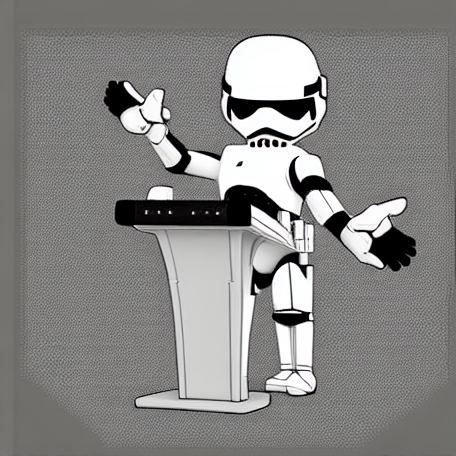

In [24]:
from transformers import pipeline
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from PIL import Image
import numpy as np
import torch
from diffusers.utils import load_image

depth_estimator = pipeline('depth-estimation')

image = load_image("https://huggingface.co/lllyasviel/sd-controlnet-depth/resolve/main/images/stormtrooper.png")

image = depth_estimator(image)['depth']
image = np.array(image)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
image = Image.fromarray(image)

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-depth", torch_dtype=torch.float16
)

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", cache_dir=f"{cache_dir}", controlnet=controlnet, safety_checker=None, torch_dtype=torch.float16
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

# Remove if you do not have xformers installed
# see https://huggingface.co/docs/diffusers/v0.13.0/en/optimization/xformers#installing-xformers
# for installation instructions
pipe.enable_xformers_memory_efficient_attention()

pipe.enable_model_cpu_offload()

image = pipe("Stormtrooper's lecture", image, num_inference_steps=20).images[0]
image
#image.save('./images/stormtrooper_depth_out.png')
